# Template Notebook for Methodologies

```{contents}
:local:
```
<!-- https://jupyterbook.org/en/stable/structure/configure.html -->

## Introduction

- This notebook focuses on the California housing dataset, which is a classic example set used in many statistics tutorials. Various instances of the dataset exist with slight variations. Here we load an instance directly available from the sklearn package ([California Housing Dataset](https://inria.github.io/scikit-learn-mooc/python_scripts/datasets_california_housing.html)). 
- The goal is typically to create a model that predicts the median house value in a block based on predictors such as: median income; median house age; avg. rooms per household; avg. bedrooms per household; total population; avg. members of households; latitude and longitude.    
- The performance of the model is typically assessed through predictive capability and metrics such as $\text{RMSE}$ and $\text{R}^2$.
- This notebook aims to present a basic data science pipeline for predictive analysis, using **linear regression** and **random forests**. 

## Importing Required Libraries

In [299]:
# %% Importing Required Libraries
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.datasets import fetch_california_housing
from scipy import stats
from scipy.spatial import KDTree 

import geopandas as gpd
import contextily as ctx
from matplotlib import cm
from matplotlib.colors import Normalize, LogNorm
import matplotlib.ticker as ticker

import matplotlib.pyplot as plt
import seaborn as sns


## Data Exploration

Loading the California housing data from scikit-learn, printing description and converting to Pandas dataframe:

In [2]:
# Loading Data
california = fetch_california_housing()
print(california.DESCR)

df = pd.DataFrame(california.data, columns=california.feature_names)
df['MedHouseVal'] = california.target


.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

:Number of Instances: 20640

:Number of Attributes: 8 numeric, predictive attributes and the target

:Attribute Information:
    - MedInc        median income in block group
    - HouseAge      median house age in block group
    - AveRooms      average number of rooms per household
    - AveBedrms     average number of bedrooms per household
    - Population    block group population
    - AveOccup      average number of household members
    - Latitude      block group latitude
    - Longitude     block group longitude

:Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived from the 1990 U.S. census, using one row per ce

Summary statistics for columns:

In [3]:
df.describe()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,MedHouseVal
count,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,3.870671,28.639486,5.429000,1.096675,1425.476744,3.070655,35.631861,-119.569704,2.068558
std,1.899822,12.585558,2.474173,0.473911,1132.462122,10.386050,2.135952,2.003532,1.153956
min,0.499900,1.000000,0.846154,0.333333,3.000000,0.692308,32.540000,-124.350000,0.149990
25%,2.563400,18.000000,4.440716,1.006079,787.000000,2.429741,33.930000,-121.800000,1.196000
50%,3.534800,29.000000,5.229129,1.048780,1166.000000,2.818116,34.260000,-118.490000,1.797000
75%,4.743250,37.000000,6.052381,1.099526,1725.000000,3.282261,37.710000,-118.010000,2.647250
max,15.000100,52.000000,141.909091,34.066667,35682.000000,1243.333333,41.950000,-114.310000,5.000010


```{admonition} Note: Missing Data
:class: note
In this particular example there's no missing data or null values present, which means we don't need to worry about data imputation, although typically this will be an important component of the data science pipeline.
```

```{admonition} Note: Categorical Data
:class: note
All the columns in this example are numerical. Typically we might also expect categorical columns, which will need pre-processing. The categorical columns may be ordinal or nominal. Ordinal categories could be transformed into corresponding ordinal integers, while nominal categories could be handled with one-hot encoding.    
```

### Marginal Histograms

A useful next step is to examine the marginal distributions of each column to determine what assumptions we can make, whether there's any clear outliers and whether it makes sense to apply any transformations to the data:

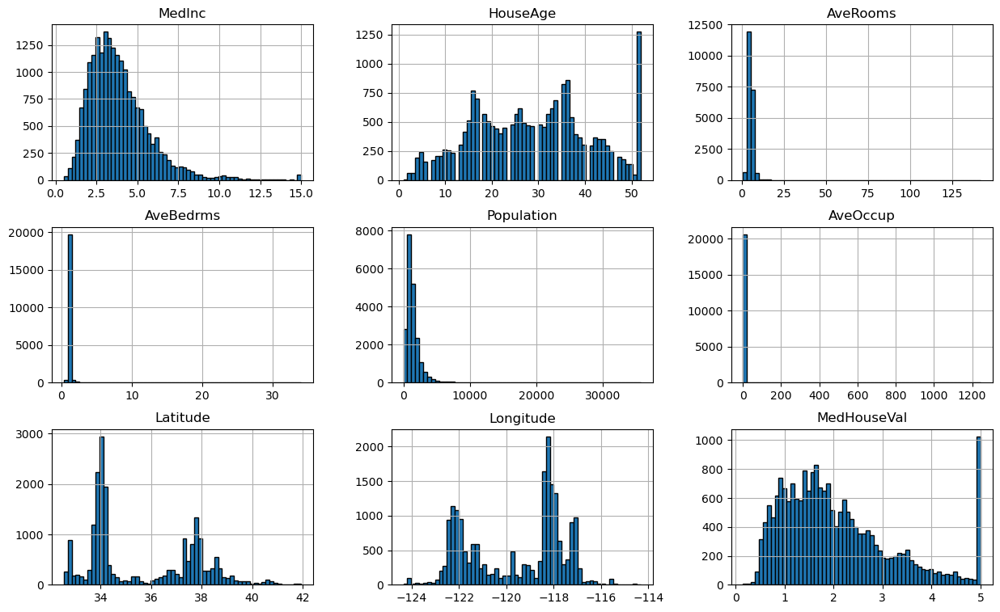

In [10]:
# Marginal Histograms
df.hist(bins=60, figsize=(15,9),color='tab:blue',edgecolor='black')
plt.show()

- Outliers are clearly present in the data, including:
    - The peaks shown at the upper ends of *HouseAge* and *MedHouseVal* are likely the result of truncating records. For example, values above \$500,000 are all recorded as \$500,001. If this is simply ignored it'll result in a downward bias in estimates. If these data points are excluded then we'll be optimising against values less than $500,000 and the model may not generalise well to more expensive regions. Ideally we would use a censored regression, modelling these data points as being at least \$500,000. For simplicity in this notebook we'll just exclude the points above \$500,000. 
    - Suspected outliers for *AveRooms*, *AveBedrms*, *Population* and *AveOccup*. These are suspected due to the high maximum x axis values. Without treatment these outliers might have a significant impact on our regression and reduce how well our model represents bulk relationships.

- There appears to be some unusual regularly spaced gaps for *HouseAge*. It's unclear what's caused this but it's unlikely to have a significant impact on our predictions. 

- Many of the distributions are either skewed or multi-modal. To reduce the skew it's common to apply a log-transformation. 

Examining the data with a crude removal of outliers can be interesting: 

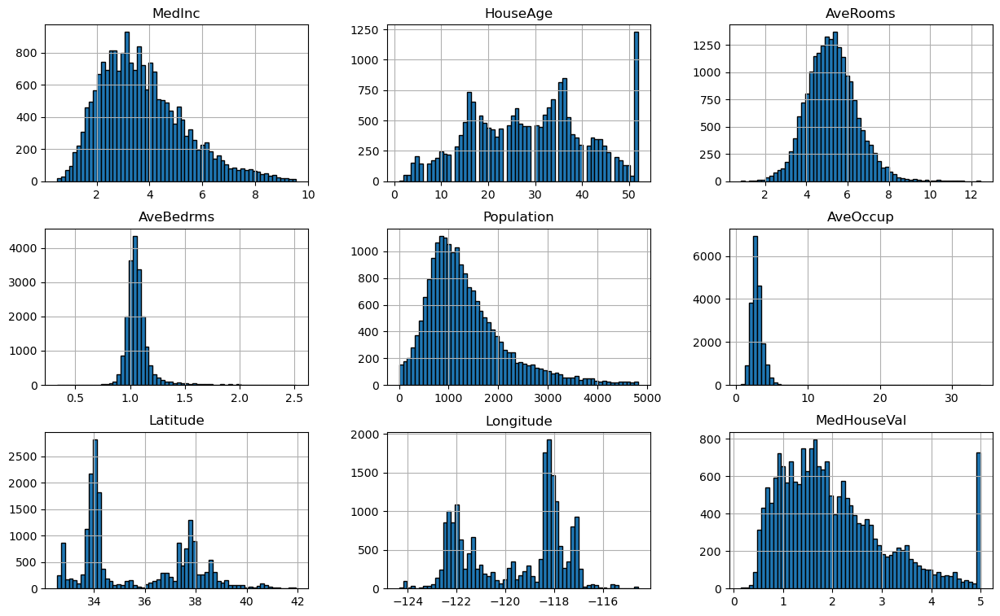

In [37]:
df_bulk = df[(np.abs(stats.zscore(df)) < 3).all(axis=1)]

# Marginal Histogram Outliers Removed
df_bulk.hist(bins=60, figsize=(15,9),color='tab:blue',edgecolor='black')
plt.show()

### Correlation Matrix and PairPlot

It's also useful to examine the correlation between all the columns in the data to quickly get a feel for which variables will have the best predictive potential and to understand colinearity between predictors. 

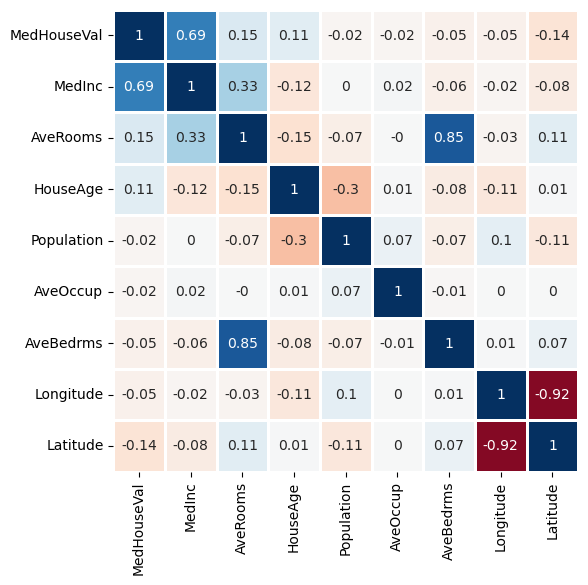

In [39]:
def corrMat(df,id=False):
    ''' Function to plot correlation of features '''
    
    corr_mat = df.corr().round(2)
    ix = corr_mat.sort_values('MedHouseVal', ascending=False).index
    corr_mat_sorted = corr_mat.loc[ix, ix]

    fig, axs = plt.subplots(figsize=(6,6))
    sns.heatmap(corr_mat_sorted,vmin=-1,vmax=1,center=0, 
                cmap='RdBu',square=False,lw=2,annot=True,cbar=False)
    plt.show()

corrMat(df.select_dtypes(include=[np.number]))

From the correlation matrix it's clear that medium income is likely to be the strongest predictor, with all other columns being relatively weak predictors. Additionally, we see a clear strong correlation between *AveRooms* and *AveBedrms*, which makes sense and indicates perhaps we don't need both predictors in our model. Finally, it's interesting to note that *Longitude* and *Latitude* have relatively weak relationships with *MedHouseVal* and have a strong negative correlation with each other. The high negative correlation is due to the fact that the coast of California goes approximately diagonally to *Longitude* and *Latitude* and the vast majority of houses lie close to the coast. It'll be important to conduct some feature design to get a spatial predictor that better represents the important components of the data, such as distance to coast.       

Again examining the correlations after removing outliers can be interesting, in particular *AveRooms* and *AveOccup* show noticably stronger correlation with *MedHouseVal*, and the correlation between *AveRooms* and *AveBedrms* is noticably reduced: 

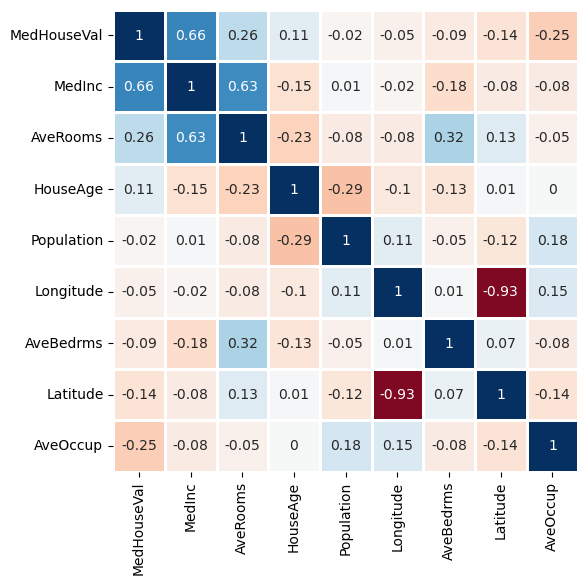

In [41]:
corrMat(df_bulk.select_dtypes(include=[np.number]))

A pairplot can be used to further examine relationships between pairs of variables, here we remove outliers, although it can also be useful to focus on the outliers specifically:

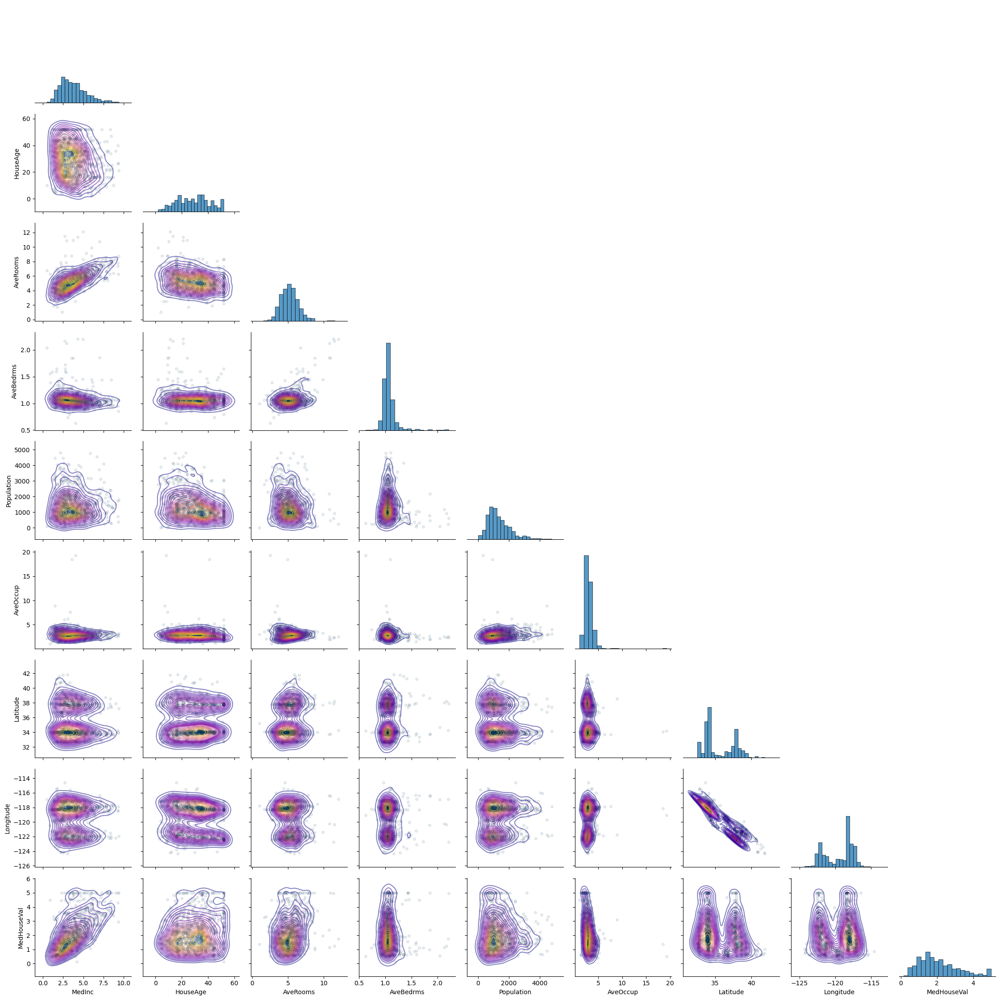

In [42]:
''' Draw a Bivariate Seaborn Pairgrid /w KDE density w/ '''

def snsPairGrid(df):

    ''' Plots a Seaborn Pairgrid w/ KDE & scatter plot of df features'''
    g = sns.PairGrid(df,corner=True)
    g.map_diag(sns.histplot,bins=20, lw=0.5) 
    g.map_lower(sns.scatterplot,s=15,edgecolor="k",linewidth=1,alpha=0.1)
    g.map_lower(sns.kdeplot,cmap='plasma', levels=20, alpha=0.5)
    plt.tight_layout()

snsPairGrid(df_bulk.sample(n=1000)) 

The pairplot indicates two major clusters of data points around specific longitude and latitude values, which is likely the result of two major cities. It would be advantageous to create a feature that captures this, maybe two columns with distance to each major city respectively. 

### Spatial Maps

Since the data is spatial in nature it is important to plot a map of the values. Here the spatial distribution for the response variable *MedHouseVal* and the 3 most significant predictors (*MedInc*, *AveRooms* and *AveOccup*) are plot.

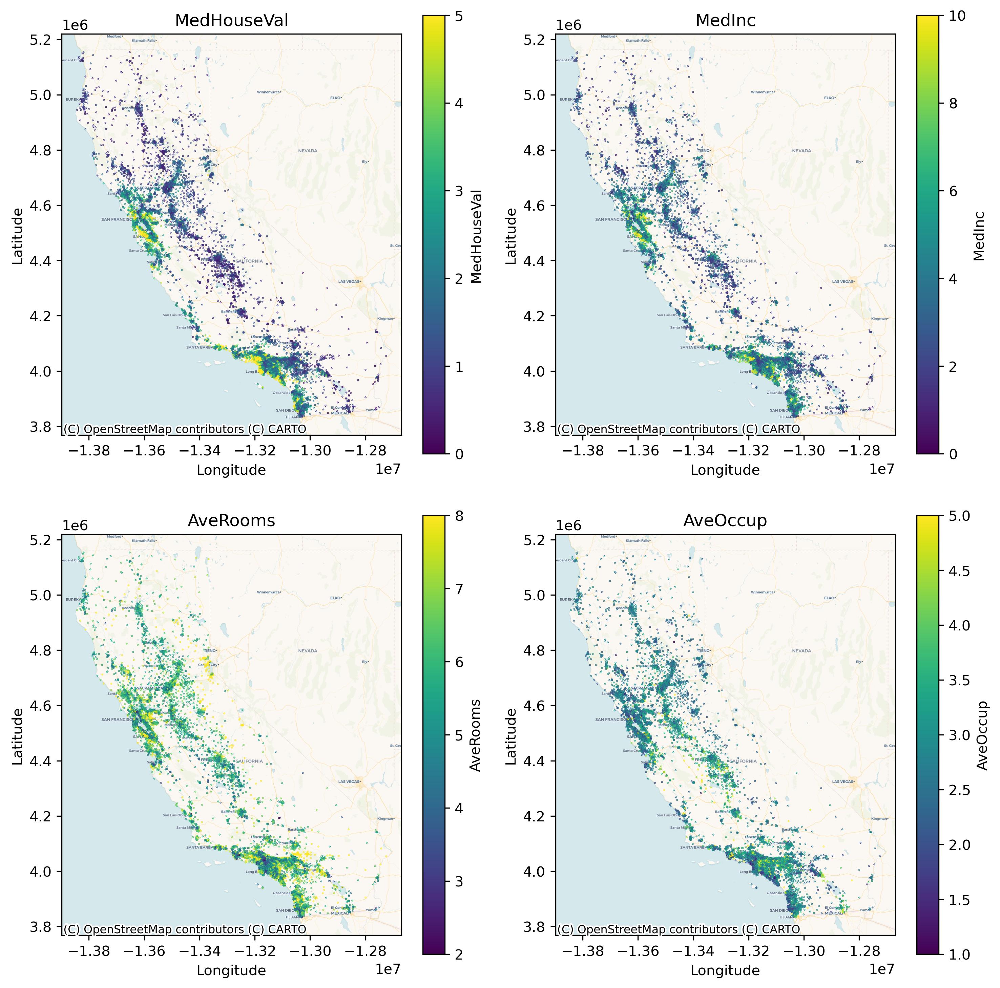

In [68]:
def spatialMap(df,column,ax,transform=None,limits=None):
    ''' Plot the spatial distribution of the data '''
    # Create a GeoDataFrame
    gdf = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.Longitude, df.Latitude))
    # Set the CRS
    gdf = gdf.set_crs(epsg=4326)  # WGS84
    gdf = gdf.to_crs(epsg=3857) 

    # Normalize price values for color mapping
    if limits!=None:
        vmin,vmax = limits
    else:
        vmin = gdf[column].min()
        vmax = gdf[column].max()
    if transform == 'log':
        norm = LogNorm(vmin=vmin, vmax=vmax)
    else:
        norm = Normalize(vmin=vmin, vmax=vmax)
    cmap = cm.viridis  # You can choose other colormaps like 'plasma', 'cividis', etc.
    gdf['color'] = gdf[column].apply(lambda x: cmap(norm(x)))
    
    # Plot the points
    gdf.plot(ax=ax,
            markersize=0.1, 
            alpha=1.0,
            color=gdf['color'])
    # Add a basemap
    # ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.CartoDB.Positron)
    # ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)
    ctx.add_basemap(ax, crs=gdf.crs.to_string(), source=ctx.providers.CartoDB.Voyager)

    # Set plot title and labels
    ax.set_title(f'{column}')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    # Create a colorbar
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])  # Only needed for the colorbar
    cbar = plt.colorbar(sm, ax=ax)
    cbar.set_label(f'{column}')

fig, axs = plt.subplots(2,2,figsize=(10, 10),dpi=300)
spatialMap(df,'MedHouseVal',axs[0,0],limits=[0,5])
spatialMap(df,'MedInc',axs[0,1],limits=[0,10])
spatialMap(df,'AveRooms',axs[1,0],limits=[2,8])
spatialMap(df,'AveOccup',axs[1,1],limits=[1,5])
plt.tight_layout()
plt.show()

The spatial map clearly illustrates the importance of the coastline in determining both the location of houses and their respective values. Two major cities exist on the coast, San Francisco and Los Angeles, with house prices nearer these cities being higher on average. It's also clear that there are rural areas where the *AveRooms* is much higher as presumably the cost of land is reduced or perhaps there are a lot of large farm houses.

It's also interesting to look at the spatial plots for the other columns in case there's something we can identify that limits their predictive power:

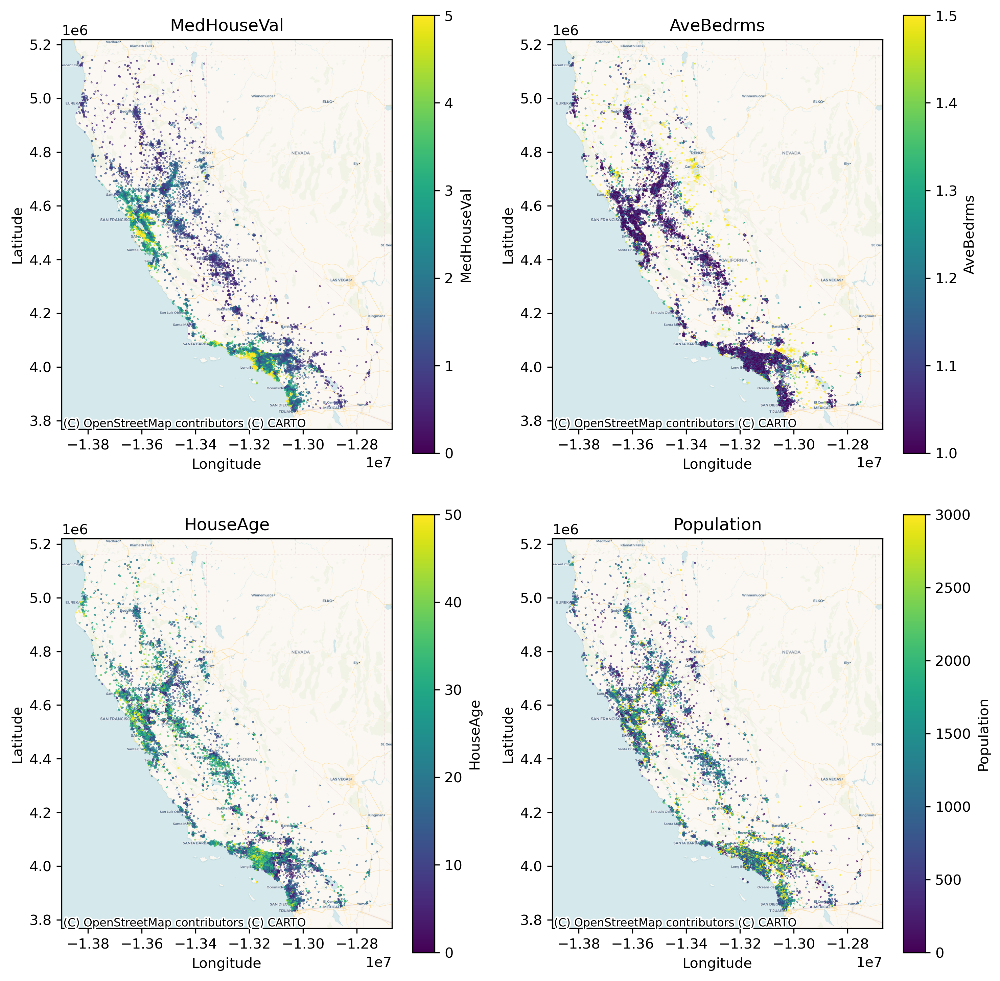

In [71]:
fig, axs = plt.subplots(2,2,figsize=(10, 10),dpi=300)
spatialMap(df,'MedHouseVal',axs[0,0],limits=[0,5])
spatialMap(df,'AveBedrms',axs[0,1],limits=[1,1.5])
spatialMap(df,'HouseAge',axs[1,0],limits=[0,50])
spatialMap(df,'Population',axs[1,1],limits=[0,3000])
plt.tight_layout()
plt.show()

The spatial map potentially sheds some light on why *Population* is so weakly correlated with *MedHouseVal*, which is due to high variance between nearby sites. That is there can be vastly different populations for neighbouring blocks. One possibility here is we could create a new predictor, which is the smoothed population. This might incorporate the idea that the most expensive houses are likely to be in blocks with low population but located near the centre of cities where the population will be highest. 

## Data Pre-Processing

### Outliers and Truncated Variables

Outliers can have a significant impact on model estimates. In general excluding outliers will make modelling of the bulk popuation simpler, although often outliers are the most interesting part of the data and being able to handle/predict them is highly desirable. Modelling outliers can improve understanding of underlying processes and can be important for the end decision making procedures post-predictions. Similarly, unusal features in the data set, such as trucation of values above some max threshold, would ideally be accounted for in the model.  

Here for simplicity we choose to not incorporate the truncated values in the training and accept that our model may not accurately represent relationships between predictors and the response beyond the truncated values. Specifically, we remove the collection of *MedHouseVal* = \$500,001 and we remove the collection of *HouseAge* = 52.    

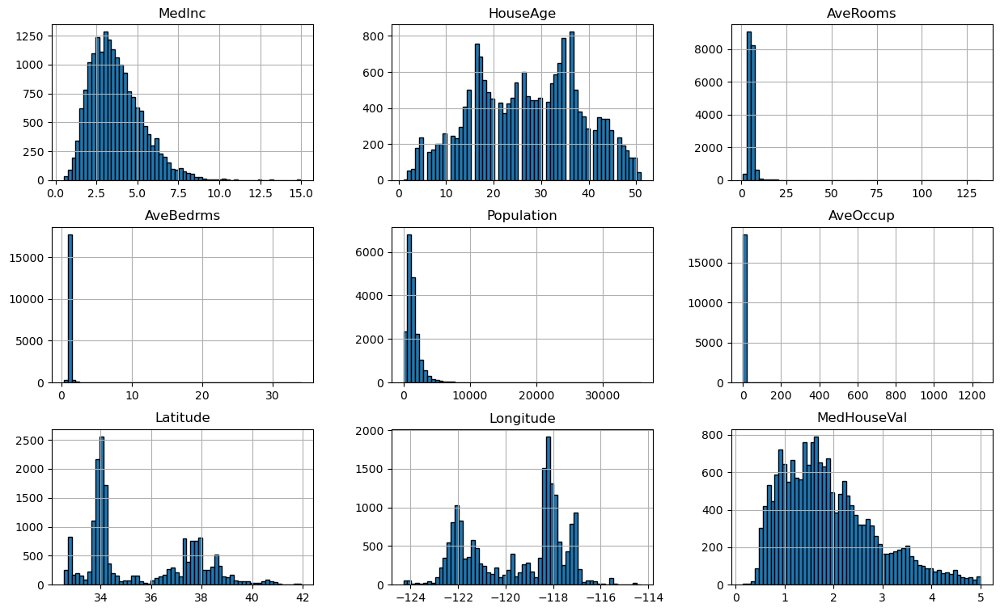

In [252]:
df_adj = df[df['MedHouseVal']<5.00001] 
df_adj = df_adj[df_adj['HouseAge']<52] 

df_adj.hist(bins=60, figsize=(15,9),color='tab:blue',edgecolor='black')
plt.show()

Instead of removing outliers we'll apply a log transformation that will reduce their influence. Additionally, as a number of the variables (*MedInc*, *Population*, *MedHouseVal*, etc.) are skewed towards values closer to zero we'll apply a log transform to help reduce skew in these variables. 

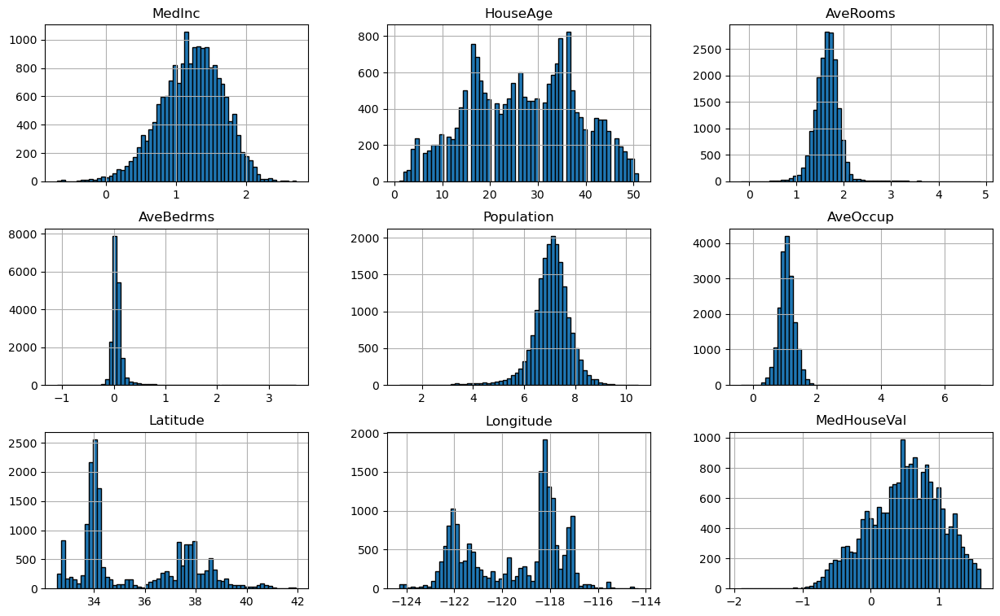

In [253]:
vars_transform = ['MedInc','AveRooms','AveBedrms','Population','AveOccup','MedHouseVal']
for var in vars_transform:
    df_adj[var] = np.log(df_adj[var])
df_adj.hist(bins=60, figsize=(15,9),color='tab:blue',edgecolor='black')
plt.show()

### Feature Engineering

The most obvious feature to engineer is a spatial variable that captures distance to the coast. There are various methods for this but in this notebook we take advantage of the geometry of the coastline to do a very crude estimate through simply adding the *Longitude* and *Latitude* values.  

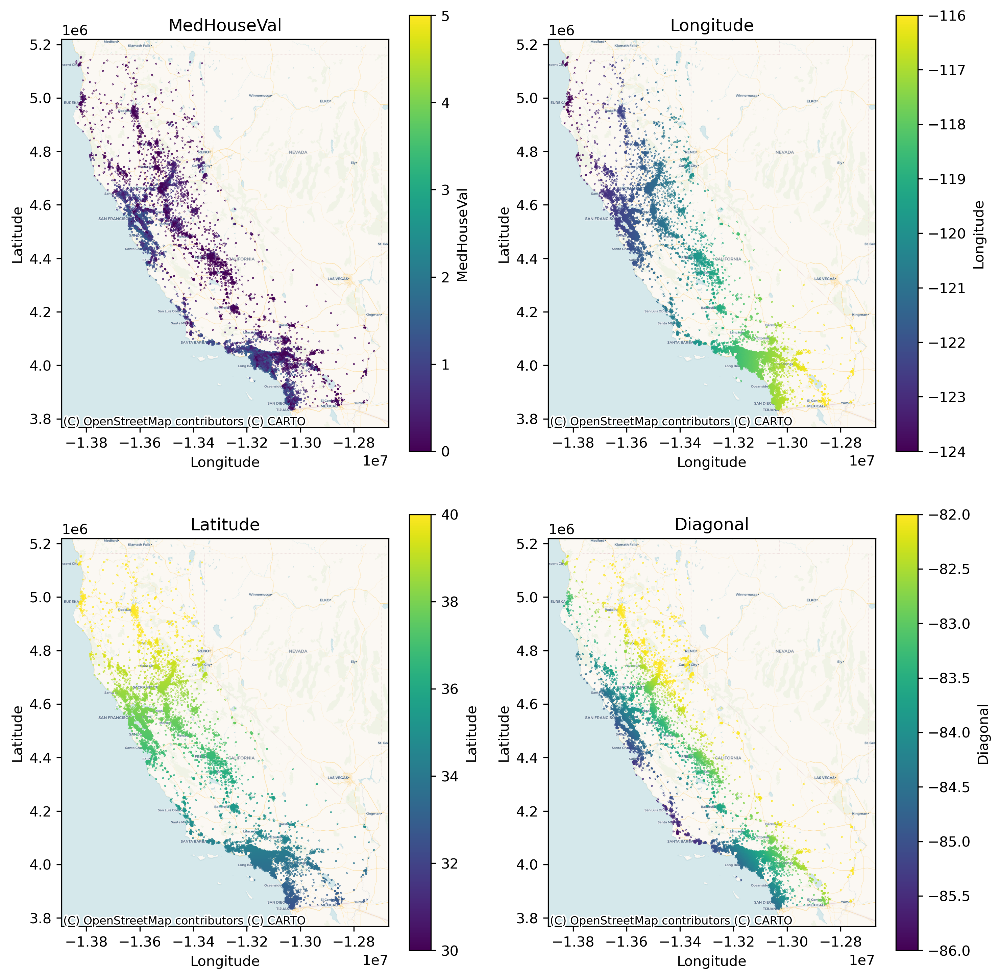

In [254]:
df_adj['Diagonal'] = (df_adj['Longitude'] + df_adj['Latitude'])         # 'diagonal coordinate', works for this coord

fig, axs = plt.subplots(2,2,figsize=(10, 10),dpi=300)
spatialMap(df_adj,'MedHouseVal',axs[0,0],limits=[0,5])
spatialMap(df_adj,'Longitude',axs[0,1],limits=[-124,-116])
spatialMap(df_adj,'Latitude',axs[1,0],limits=[30,40])
spatialMap(df_adj,'Diagonal',axs[1,1],limits=[-86,-82])
plt.tight_layout()
plt.show()

Note that this is a poor approximation as the coast is not a diagonal line, but for the purposes of this notebook it will do. Note the relatively high magnitude negative correlation now shown for the predictor '*Diagonal*' with *MedHouseVal*:

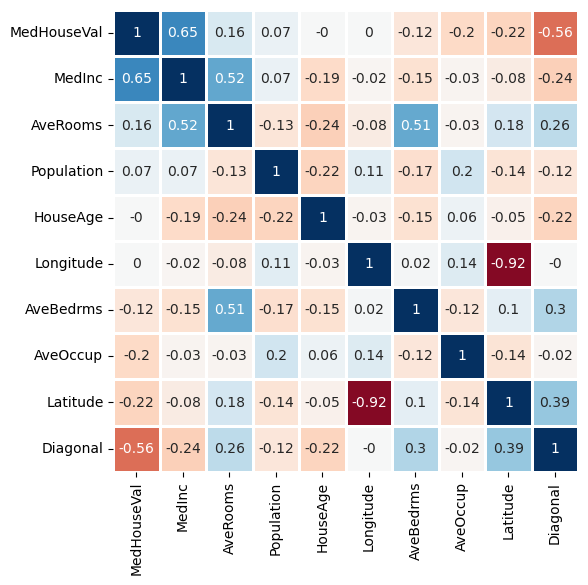

In [255]:
corrMat(df_adj.select_dtypes(include=[np.number]))

It was also mentioned earlier that it would be interesting to create a smoothed *Population* variable. Here we follow a basic spatial smoothing presented in this post: [Spatial Smoothing with Python](https://www.linkedin.com/pulse/spatial-smoothing-python-ameya-damle-8pkze). 

In [256]:
def spatial_smoothing_gaussian(df, var, k=50, bandwidth=10000):
    gdf = gpd.GeoDataFrame(df_adj, geometry=gpd.points_from_xy(df_adj.Longitude, df_adj.Latitude))
    gdf = gdf.set_crs(epsg=4326)  # WGS84
    gdf = gdf.to_crs(epsg=3857) 

    gdf['centroid'] = gdf.geometry.centroid 
    centroids = np.array([[point.x, point.y] for point in gdf.centroid]) 
    kdtree = KDTree(centroids) 

    values = gdf[var].values
    smoothed_values = np.zeros_like(values)
    for i, centroid in enumerate(centroids):
        distances, indices = kdtree.query(centroid, k=k)
        weights = np.exp(-distances**2 / (2 * bandwidth**2))
        smoothed_values[i] = np.sum(values[indices] * weights) / np.sum(weights)
    return smoothed_values 

df_adj['Smoothed_Population'] = spatial_smoothing_gaussian(df_adj, 'Population')

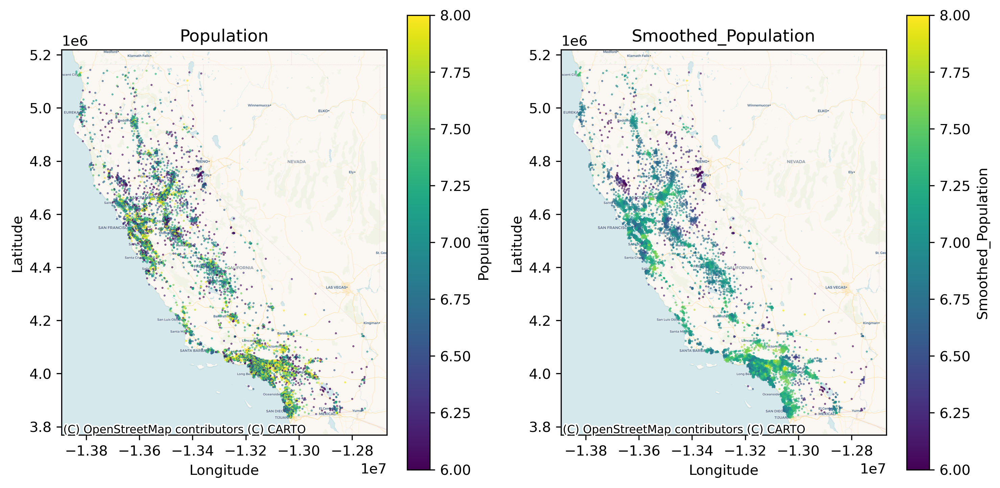

In [257]:
fig, axs = plt.subplots(1,2,figsize=(10, 5),dpi=300)
spatialMap(df_adj,'Population',axs[0],limits=[6,8])
spatialMap(df_adj,'Smoothed_Population',axs[1],limits=[6,8])
plt.tight_layout()
plt.show()

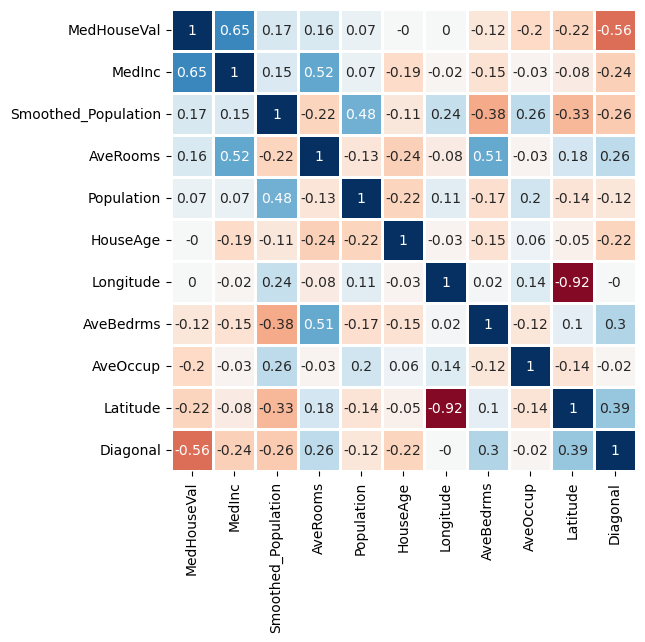

In [258]:
corrMat(df_adj.select_dtypes(include=[np.number]))

*Smoothed_Population* is not that strongly correlated with *MedHouseVal* either but perhaps together with *Population* they'll be important predictors. 

### Scaling Data

It's normally a good idea to scale the data as we don't want some variables to have a disproportionately high impact just because of the baseline scale at which they're measured. 

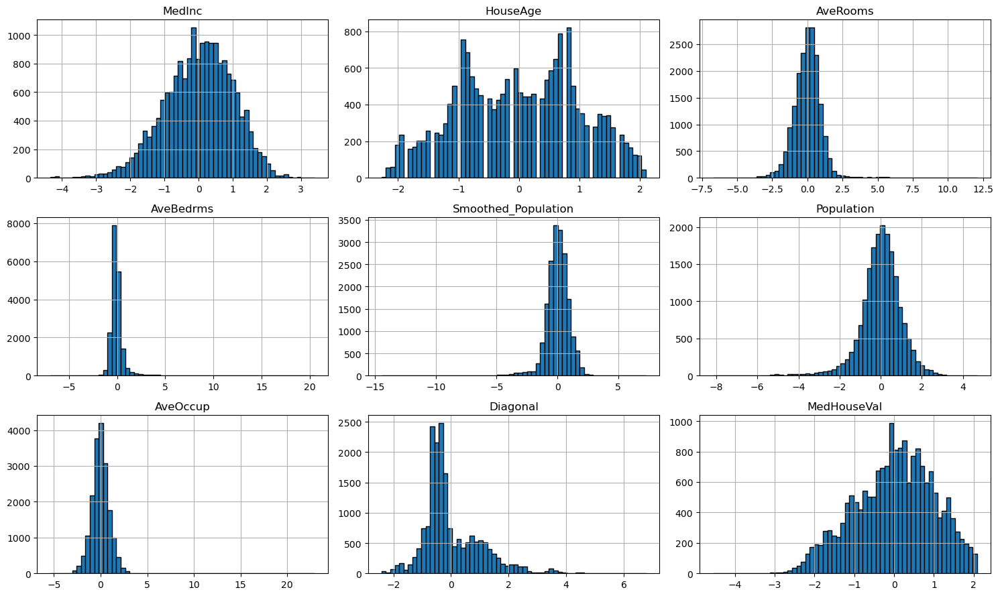

In [259]:
vars = ['MedInc','HouseAge','AveRooms','AveBedrms','Smoothed_Population','Population','AveOccup','Diagonal','MedHouseVal']
predictors = vars[:-1]
target = 'MedHouseVal'
df_adj= df_adj[vars]

scaler = StandardScaler()
df_adj = pd.DataFrame(scaler.fit_transform(df_adj),columns = df_adj.columns)
df_adj.hist(bins=60, figsize=(15,9),color='tab:blue',edgecolor='black')
plt.tight_layout()
plt.show()


### Train and Test Splits

To evaluate the model it's normal to split the dataset in to train and test sets, which helps identify overfitting. 

In [262]:
# %% Splitting into Training and Testing Data 
df_adj_train,df_adj_test = train_test_split(df_adj,test_size=0.3,random_state=43) # 70-30 split

## Model Training and Evaluation

Normally model design is an important component of the data science pipeline. Starting with simple model designs and iteratively improving complexity and performance. Here as we're not doing any complicated model design we just demonstrate evaluating performance for two off the shelf methods of linear regression and random forests. 

In [326]:
predictors = ['MedInc','HouseAge','AveRooms','AveBedrms','Smoothed_Population','Population','AveOccup','Diagonal']
target = 'MedHouseVal'

### Linear Regression

In [349]:
# Linear Regression
print("Linear Regression Model")
model = LinearRegression()
model.fit(df_adj_train[predictors],df_adj_train[target])
df_adj_train['Predicted'] = model.predict(df_adj_train[predictors])
df_adj_test['Predicted'] = model.predict(df_adj_test[predictors])

# Unscaling the target variable and taking the exponential to undo the log transformation
df_adj_test_unscaled = pd.DataFrame(scaler.inverse_transform(df_adj_test.drop(columns=['Predicted'])),columns = vars)
df_adj_test_unscaled['Predicted'] = scaler.inverse_transform(df_adj_test.drop(columns=['MedHouseVal']))[:,-1]
for var in ['MedHouseVal','Predicted']:
    df_adj_test_unscaled[var] = np.exp(df_adj_test_unscaled[var])
df_adj_test_unscaled_lr = df_adj_test_unscaled.copy() # saving copy for later comparison

# Model Evaluation
mse = mean_squared_error(df_adj_test_unscaled_lr[target],df_adj_test_unscaled_lr['Predicted'])
r2 = model.score(df_adj_test[predictors],df_adj_test[target])
print(f'MSE: {mse}')
print(f'R2: {r2}')
print("Linear Regression Coefficients Sorted:")
feature_importance = pd.Series(model.coef_, index=predictors)
print(feature_importance.sort_values(ascending=False,key=abs))


Linear Regression Model
MSE: 0.3402969437452842
R2: 0.6481180816272228
Linear Regression Coefficients Sorted:
MedInc                 0.665349
Diagonal              -0.387176
AveOccup              -0.180541
AveBedrms              0.179110
AveRooms              -0.157178
HouseAge               0.047846
Smoothed_Population    0.043232
Population             0.014238
dtype: float64


The linear regression model explains ~65\% of the variance seen in the response variable *MedHouseVal* with a mean error of $\sqrt{0.34}=0.58=\$58,000$ , which is a good start. It is expected that these metrics could be substantially improved by both using more sophisticated models and more sophisticated feature design. Models that capture non-linear relationships in the data are likely to outperform standard linear regression and improving the quality of features, such as incorporating an actual distance to coast predictor, will also aid predictive performance. It is interesting to note that from the coefficients of the regression the *Smoothed_Population* and *Population* features have relatively weak predictive strength. This indicates that the *Smoothed_Population* predictor isn't quite capturing what we want, which is some measure of the surrounding population density and whether we're located in a city. An improvement might be to sum all the block populations within a certain distance from the target point and to compute the relative distance from the closest major city. 



### Random Forest

In [350]:
# Random Forest
print("\n Random Forest Model")
model = RandomForestRegressor(n_estimators=100)
model.fit(df_adj_train[predictors],df_adj_train[target])
df_adj_train['Predicted'] = model.predict(df_adj_train[predictors])
df_adj_test['Predicted'] = model.predict(df_adj_test[predictors])

# Unscaling the response variable and taking the exponential to undo the log transformation
df_adj_test_unscaled = pd.DataFrame(scaler.inverse_transform(df_adj_test.drop(columns=['Predicted'])),columns = vars)
df_adj_test_unscaled['Predicted'] = scaler.inverse_transform(df_adj_test.drop(columns=['MedHouseVal']))[:,-1]
for var in ['MedHouseVal','Predicted']:
    df_adj_test_unscaled[var] = np.exp(df_adj_test_unscaled[var])
df_adj_test_unscaled_rf = df_adj_test_unscaled.copy() # saving copy for later comparison

# Model Evaluation
mse = mean_squared_error(df_adj_test_unscaled_rf[target],df_adj_test_unscaled_rf['Predicted'])
r2 = model.score(df_adj_test[predictors],df_adj_test[target])
print(f'MSE: {mse}')
print(f'R2: {r2}')
print("Random Forest Feature Importances:")
feature_importance = pd.Series(model.feature_importances_, index=predictors)
print(feature_importance.sort_values(ascending=False,key=abs))


 Random Forest Model
MSE: 0.2388388013843185
R2: 0.7669026729219449
Random Forest Feature Importances:
Diagonal               0.426999
MedInc                 0.309790
AveOccup               0.088110
Smoothed_Population    0.040944
AveRooms               0.040814
HouseAge               0.034302
Population             0.032156
AveBedrms              0.026885
dtype: float64


The random forest regression model shows a clear improvement in predictive performance, explaining ~77\% of the variance seen in the response variable *MedHouseVal* with a mean error of $\sqrt{0.24}=0.49=\$49,000$. Substantial improvements are still expected by refining the model and incorporating more sophisticated feature design. It is interesting to note that the *Diagonal* predictor has now become the most important, which indicates that there are important non-linear relationships in with this predictor that the random forest algorithm is able to partially represent. 

### Examining Predictions and Comparisons

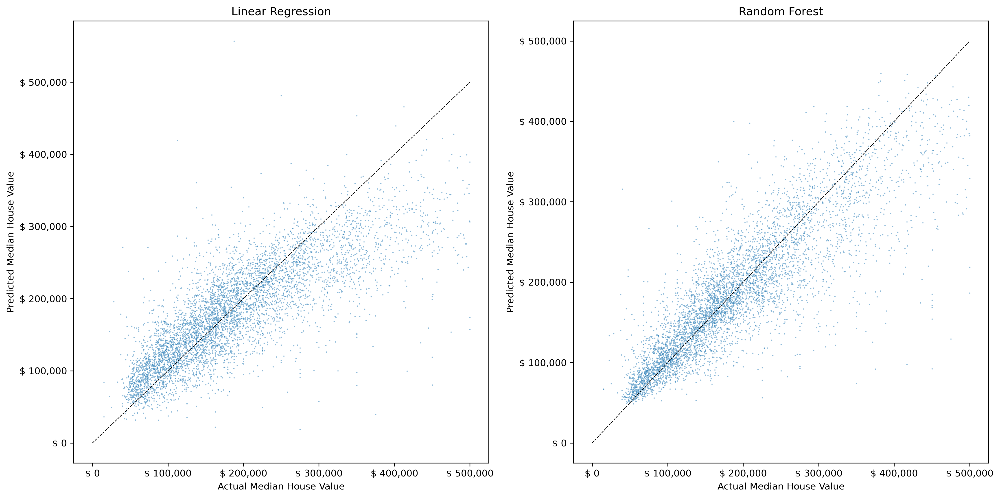

In [340]:
# Plotting Predicted vs Actual
fig, axs = plt.subplots(1,2,figsize=(15,7.5),dpi=300)

for ax,df in zip(axs,[df_adj_test_unscaled_lr,df_adj_test_unscaled_rf]):
    sns.scatterplot(x='MedHouseVal',y='Predicted',data=df,ax=ax,alpha=0.5,s=2.0)
    ax.plot([0,5],[0,5],color='black',linestyle='--',linewidth=0.7)
    ax.set_xlabel('Actual Median House Value')
    ax.set_ylabel('Predicted Median House Value')

    tick = ticker.FuncFormatter(lambda x, pos: f'$ {x*100000:,.0f}')
    ax.xaxis.set_major_formatter(tick)
    ax.yaxis.set_major_formatter(tick)

    ax.set_title('Linear Regression' if ax==axs[0] else 'Random Forest')

plt.tight_layout()
plt.show()


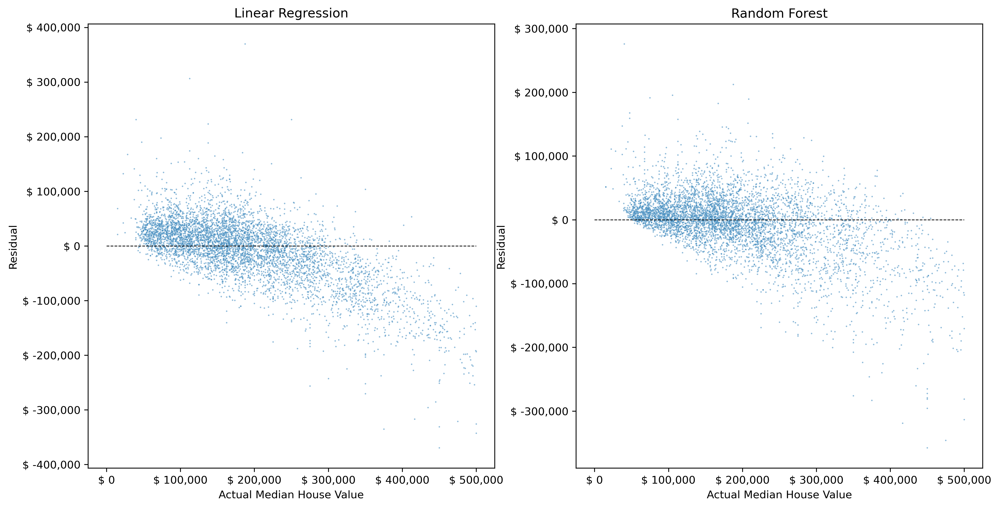

In [342]:
# Plottin Residuals vs Actual
fig, axs = plt.subplots(1,2,figsize=(15,7.5),dpi=300)

for ax,df in zip(axs,[df_adj_test_unscaled_lr,df_adj_test_unscaled_rf]):
    df['Residual'] = df['Predicted'] - df['MedHouseVal']
    sns.scatterplot(x='MedHouseVal',y='Residual',data=df,ax=ax,alpha=0.5,s=2.0)
    ax.plot([0,5],[0,0],color='black',linestyle='--',linewidth=0.7)
    ax.set_xlabel('Actual Median House Value')
    ax.set_ylabel('Residual')

    tick = ticker.FuncFormatter(lambda x, pos: f'$ {x*100000:,.0f}')
    ax.xaxis.set_major_formatter(tick)
    ax.yaxis.set_major_formatter(tick)

    ax.set_title('Linear Regression' if ax==axs[0] else 'Random Forest')


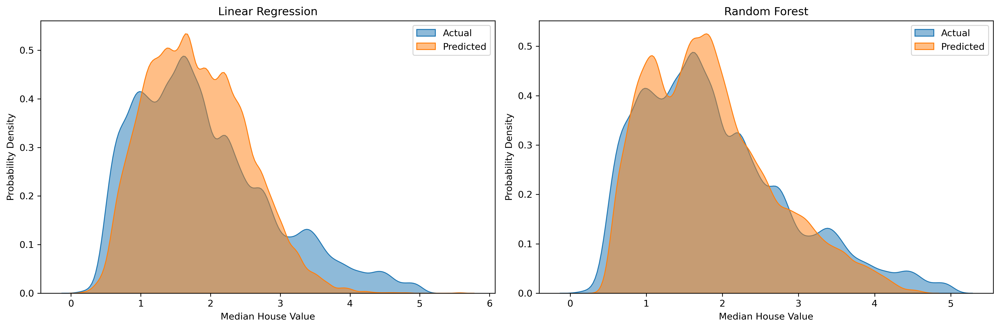

In [346]:
# Plotting Distributions of Actual and Predicted
fig, axs = plt.subplots(1,2,figsize=(15,5),dpi=300)

for ax,df in zip(axs,[df_adj_test_unscaled_lr,df_adj_test_unscaled_rf]):
    sns.kdeplot(df['MedHouseVal'], bw_method=0.1,fill=True,alpha=0.5,label='Actual',ax=ax)
    sns.kdeplot(df['Predicted'], bw_method=0.1,fill=True,alpha=0.5,label='Predicted',ax=ax)
    ax.set_xlabel('Median House Value')
    ax.set_ylabel('Probability Density')
    ax.set_title('Linear Regression' if ax==axs[0] else 'Random Forest')
    ax.legend()

plt.tight_layout()
plt.show()

While the predictive performance of the random forest model is a clear improvement over the linear regression model, it's also clear from these figures that both models experience a negative bias at higher house values and a positive bias at lower house values. That is both models on average under-predict the value for the most expensive houses and over-predict for the cheapest houses. It is ususal for models to struggle with predicting extream values and the bias is the result of differences in the relationships with predictors for the bulk data and extreams. One avenue for correcting this might be to model the extreams independently of the bulk data. Additionally, we could try to incorporate extra predictors that are targeted at improving understanding in the extreams. Further exploration of the extreams and for example their spatial locations will help in identifying the best avenue for further improvement. 


## Conclusions

A very basic data science pipeline is presented as a template for the sort of style expected in the more sophisticated methodology notebooks to be incorporated. The aim is to present the various steps involved when applying a certain methodology, beyond just the training step. The goal is not to focus too heavily on the science but to comment where necessary to motivate methodology choices. Hopefully the notebooks will provide a gentle step-by-step introduction for sharing methodologies within the environmental sciences community. 